# **Introduction**

**About Dataset**

* **Breast cancer** is one of the **most common** causes of death among **women worldwide**. Early detection helps in reducing the **number of early deaths**. The data reviews the **medical images of breast cancer** using ultrasound scan. **Breast Ultrasound Dataset** is categorized into **three classes** $:$ **normal, benign, and malignant images**. **Breast ultrasound images** can produce great results in **classification, detection, and segmentation** of breast cancer when combined with machine learning. 

* The data collected at baseline include **breast ultrasound images among women** in ages between 25 and 75 years old. This data was collected in **2018**. The number of patients is **600 female patients**. The dataset consists of **780 images** with an **average image size of 500*500 pixels**. The images are in PNG format. The ground truth images are presented with original images. The images are categorized into **three classes, which are normal, benign, and malignant**.

**Approach**

* **AttentionUNet/UNet** is the best know model for **Multi-Class Segmentation**, thats why we will be creating a **Attention UNet Model**.
* As the **image Dataset** is **old**, please **do not use it for any new medical operations**.
* All the images are of 500 X 500 pixels, **Kaggle RAM** wil not be enough so we will be resizing the Image to **256 X 256 pixels**.

**Model Architecture**

* The Model will consist of a **Encoder Block, Decoder Block and a Attention Gate.**

# **Imports**

In [1]:
from IPython.display import clear_output
!pip install tf_explain
clear_output()

In [2]:
# common
import os
import keras
import numpy as np
import pandas as pd
from glob import glob
import tensorflow as tf
import tensorflow.image as tfi

# Data
from keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical

# Data Viz
import matplotlib.pyplot as plt

# Model 
from keras.models import Model
from keras.layers import Layer
from keras.layers import Conv2D,Dense,Flatten
from keras.layers import Dropout
from keras.layers import UpSampling2D
from keras.layers import concatenate
from keras.layers import Add
from keras.layers import Multiply
from keras.layers import Input
from keras.layers import MaxPool2D,GlobalAveragePooling2D
from keras.layers import BatchNormalization

# Callbacks 
from keras.callbacks import Callback
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from tf_explain.core.grad_cam import GradCAM

# Metrics
from keras.metrics import MeanIoU

# **Data**

In [3]:
def load_image(image, SIZE):
    return np.round(tfi.resize(img_to_array(load_img(image))/255.,(SIZE, SIZE)),4)

def load_images(image_paths, SIZE, mask=False, trim=None):
    if trim is not None:
        image_paths = image_paths[:trim]
    
    if mask:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 1))
    else:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3))
    
    for i,image in enumerate(image_paths):
        img = load_image(image,SIZE)
        if mask:
            images[i] = img[:,:,:1]
        else:
            images[i] = img
    
    return images

In [4]:
def show_image(image, title=None, cmap=None, alpha=1):
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title is not None:
        plt.title(title)
    plt.axis('off')

def show_mask(image, mask, cmap=None, alpha=0.4):
    plt.imshow(image)
    plt.imshow(tf.squeeze(mask), cmap=cmap, alpha=alpha)
    plt.axis('off')

In [6]:
SIZE = 256

In [7]:
#root_path = '../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/'
root_path = '../input/brain-tumor-dataset-segmentation-and-classification/DATASET/Segmentation'
classes = sorted(os.listdir(root_path))
classes

['Glioma', 'Meningioma', 'Pituitary tumor']

In [8]:
single_mask_paths = sorted([sorted(glob(root_path + name + "/*mask.png")) for name in classes])
# double_mask_paths = sorted([sorted(glob(root_path + name + "/*mask_1.png")) for name in classes])

In [9]:
import glob
import os

root_path = '../input/brain-tumor-dataset-segmentation-and-classification/DATASET/Segmentation'

image_paths = []
mask_paths = []

for cls in classes:
    folder = os.path.join(root_path, cls)
    mask_files = sorted(glob.glob(os.path.join(folder, "*_mask.png")))

    for mask_path in mask_files:
        image_path = mask_path.replace("_mask", "")
        if os.path.exists(image_path):
            image_paths.append(image_path)
            mask_paths.append(mask_path)
        else:
            print(f"Missing image for: {mask_path}")

print("Total image-mask pairs:", len(image_paths))


Total image-mask pairs: 2192


Found 2192 image-mask pairs.


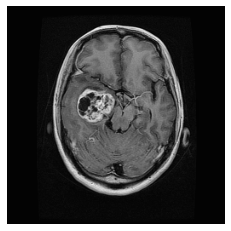

In [10]:
print(f"Found {len(image_paths)} image-mask pairs.")
if image_paths:
    show_image(load_image(image_paths[0], SIZE))
else:
    print("No valid images found.")


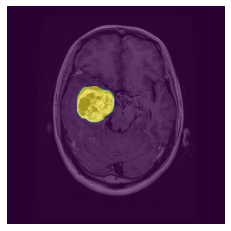

In [11]:
show_mask(load_image(image_paths[0], SIZE), load_image(mask_paths[0], SIZE)[:,:,0], alpha=0.6)

## **Approach**

Below here I have explained my strategy to tackel the multiple mask Images.

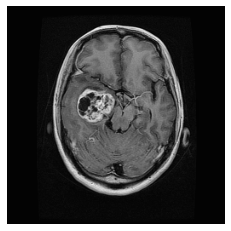

In [12]:
show_image(load_image('../input/brain-tumor-dataset-segmentation-and-classification/DATASET/Segmentation/Glioma/enh_1841.png', SIZE))

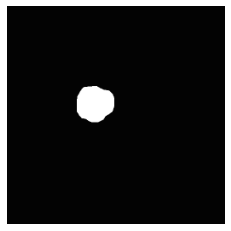

In [13]:
show_image(load_image('../input/brain-tumor-dataset-segmentation-and-classification/DATASET/Segmentation/Glioma/enh_1841_mask.png', SIZE))

In [14]:
# show_image(load_image('../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (100)_mask.png', SIZE))

I don't want the data this way, as both the masks belongs to the same class. A better idea can be to merge both these images

In [21]:
img = np.zeros((SIZE, SIZE, 3))
# mask1 = load_image('../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (100)_mask_1.png', SIZE)
# mask2 = load_image('../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (100)_mask.png', SIZE)

# img = img + mask1 + mask2
# img = img[0,:,:,0]
# show_image(img, cmap='gray')

We first merged them and them simple used the 1st channel because that is enough.

In [22]:
# show_image(load_image('../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (100).png', SIZE))
# plt.imshow(img, cmap='binary', alpha=0.4)
# plt.axis('off')
# plt.show()

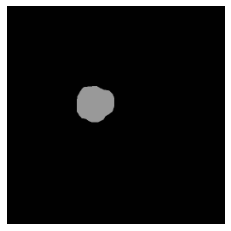

In [23]:
show_image(load_image('/kaggle/input/brain-tumor-dataset-segmentation-and-classification/DATASET/Segmentation/Glioma/enh_1841_mask.png', SIZE))
plt.imshow(img, cmap='gray', alpha=0.4)
plt.axis('off')
plt.show()

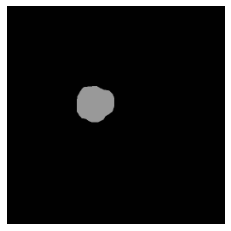

In [24]:
show_image(load_image('/kaggle/input/brain-tumor-dataset-segmentation-and-classification/DATASET/Segmentation/Glioma/enh_1841_mask.png', SIZE))
plt.imshow(img, alpha=0.4)
plt.axis('off')
plt.show()

This is how it looks with different cmaps. But you can drop them as then are very less in number (i.e 16) and this will not affect training much.

## **Data Work**

In [25]:
images = load_images(image_paths, SIZE)
masks = load_images(mask_paths, SIZE, mask=True)

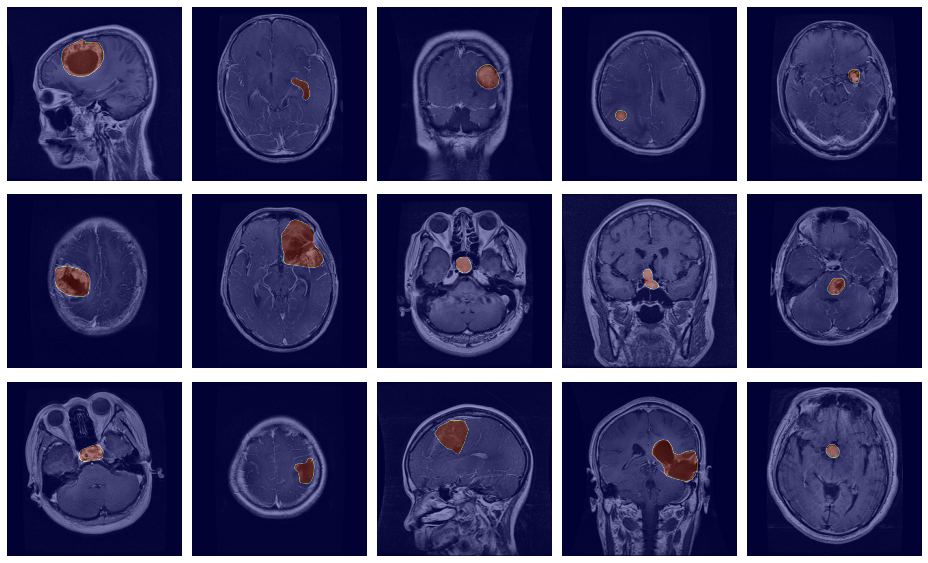

In [26]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='jet')
plt.tight_layout()
plt.show()

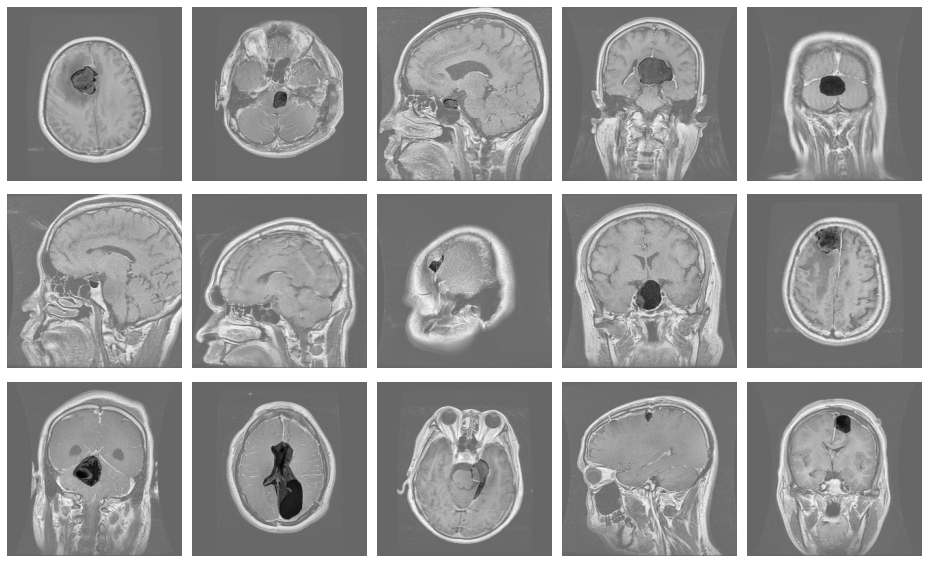

In [27]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='binary')
plt.tight_layout()
plt.show()

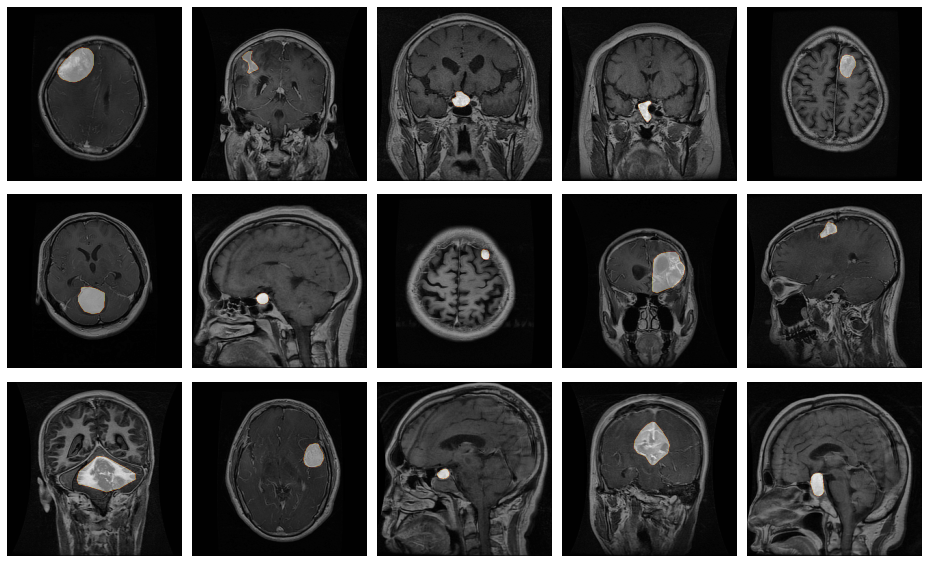

In [28]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='afmhot')
plt.tight_layout()
plt.show()

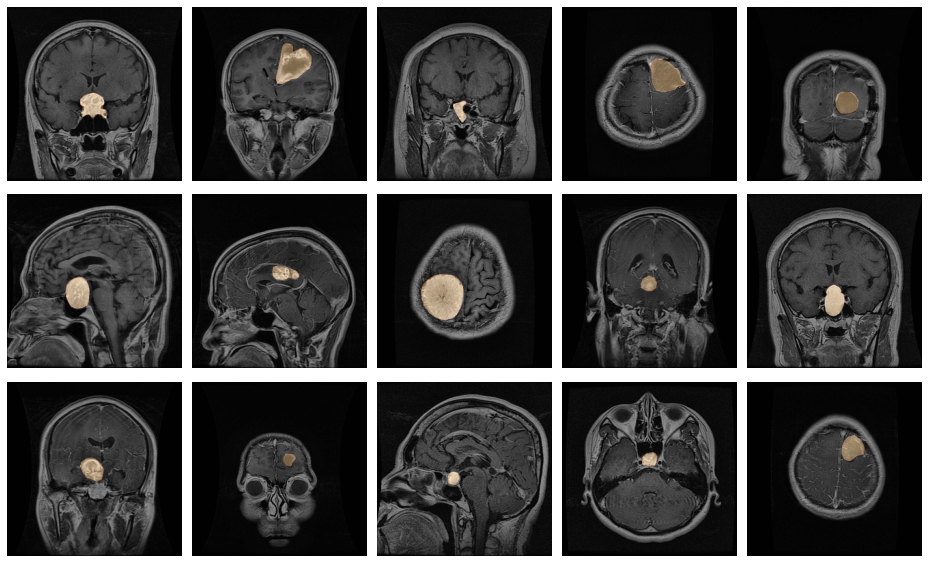

In [29]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='copper')
plt.tight_layout()
plt.show()

# **Encoder**

In [30]:
class EncoderBlock(Layer):

    def __init__(self, filters, rate, pooling=True, **kwargs):
        super(EncoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate
        self.pooling = pooling

        self.c1 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.drop = Dropout(rate)
        self.c2 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.pool = MaxPool2D()

    def call(self, X):
        x = self.c1(X)
        x = self.drop(x)
        x = self.c2(x)
        if self.pooling:
            y = self.pool(x)
            return y, x
        else:
            return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
            'pooling':self.pooling
        }

# **Decoder**

In [31]:
class DecoderBlock(Layer):

    def __init__(self, filters, rate, **kwargs):
        super(DecoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate

        self.up = UpSampling2D()
        self.net = EncoderBlock(filters, rate, pooling=False)

    def call(self, X):
        X, skip_X = X
        x = self.up(X)
        c_ = concatenate([x, skip_X])
        x = self.net(c_)
        return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
        }

# **Attention Gate**

In [33]:
class AttentionGate(Layer):

    def __init__(self, filters, bn, **kwargs):
        super(AttentionGate, self).__init__(**kwargs)

        self.filters = filters
        self.bn = bn

        self.normal = Conv2D(filters, kernel_size=3, padding='same', activation='relu', kernel_initializer='he_normal')
        self.down = Conv2D(filters, kernel_size=3, strides=2, padding='same', activation='relu', kernel_initializer='he_normal')
        self.learn = Conv2D(1, kernel_size=1, padding='same', activation='sigmoid')
        self.resample = UpSampling2D()
        self.BN = BatchNormalization()

    def call(self, X):
        X, skip_X = X

        x = self.normal(X)
        skip = self.down(skip_X)
        x = Add()([x, skip])
        x = self.learn(x)
        x = self.resample(x)
        f = Multiply()([x, skip_X])
        if self.bn:
            return self.BN(f)
        else:
            return f
        # return f

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            "bn":self.bn
        }

# **Custom Callback**

In [35]:
class ShowProgress(Callback):
    def on_epoch_end(self, epochs, logs=None):
        id = np.random.randint(200)
        exp = GradCAM()
        image = images[id]
        mask = masks[id]
        pred_mask = self.model.predict(image[np.newaxis,...])
        cam = exp.explain(
            validation_data=(image[np.newaxis,...], mask),
            class_index=1,
            layer_name='Attention4',
            model=self.model
        )

        plt.figure(figsize=(10,5))

        plt.subplot(1,3,1)
        plt.title("Original Mask")
        show_mask(image, mask, cmap='copper')

        plt.subplot(1,3,2)
        plt.title("Predicted Mask")
        show_mask(image, pred_mask, cmap='copper')

        plt.subplot(1,3,3)
        show_image(cam,title="GradCAM")

        plt.tight_layout()
        plt.show()

# **Attention UNet**

In [36]:
# Inputs
input_layer = Input(shape=images.shape[-3:])

# Encoder
p1, c1 = EncoderBlock(32,0.1, name="Encoder1")(input_layer)
p2, c2 = EncoderBlock(64,0.1, name="Encoder2")(p1)
p3, c3 = EncoderBlock(128,0.2, name="Encoder3")(p2)
p4, c4 = EncoderBlock(256,0.2, name="Encoder4")(p3)

# Encoding
encoding = EncoderBlock(512,0.3, pooling=False, name="Encoding")(p4)

# Attention + Decoder

a1 = AttentionGate(256, bn=True, name="Attention1")([encoding, c4])
d1 = DecoderBlock(256,0.2, name="Decoder1")([encoding, a1])

a2 = AttentionGate(128, bn=True, name="Attention2")([d1, c3])
d2 = DecoderBlock(128,0.2, name="Decoder2")([d1, a2])

a3 = AttentionGate(64, bn=True, name="Attention3")([d2, c2])
d3 = DecoderBlock(64,0.1, name="Decoder3")([d2, a3])


a4 = AttentionGate(32, bn=True, name="Attention4")([d3, c1])
d4 = DecoderBlock(32,0.1, name="Decoder4")([d3, a4])

# Output 
output_layer = Conv2D(1, kernel_size=1, activation='sigmoid', padding='same')(d4)

# Model
model = Model(
    inputs=[input_layer],
    outputs=[output_layer]
)

# Compile
model.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy', MeanIoU(num_classes=2, name='IoU')]
)

# Callbacks
cb = [
    # EarlyStopping(patience=3, restore_best_weight=True), # With Segmentation I trust on eyes rather than on metrics
    ModelCheckpoint("AttentionCustomUNet.h5", save_best_only=True),
    ShowProgress()
]

# **Training**

Epoch 1/50
274/274 [==============================] - 94s 281ms/step - loss: 0.1845 - accuracy: 3.6914e-04 - IoU: 0.4918 - val_loss: 0.1748 - val_accuracy: 0.0014 - val_IoU: 0.4935


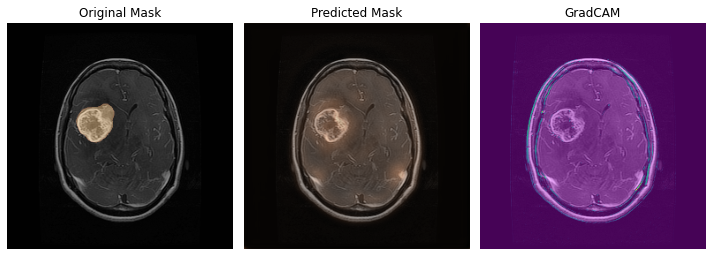

Epoch 2/50
274/274 [==============================] - 68s 250ms/step - loss: 0.1087 - accuracy: 0.0027 - IoU: 0.4915 - val_loss: 0.1348 - val_accuracy: 0.0030 - val_IoU: 0.4935


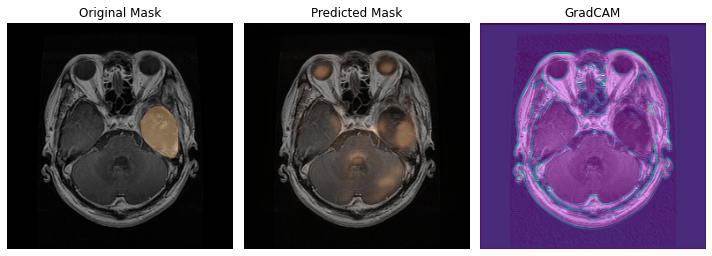

Epoch 3/50
274/274 [==============================] - 69s 250ms/step - loss: 0.0999 - accuracy: 0.0055 - IoU: 0.4918 - val_loss: 0.1047 - val_accuracy: 0.0013 - val_IoU: 0.4935


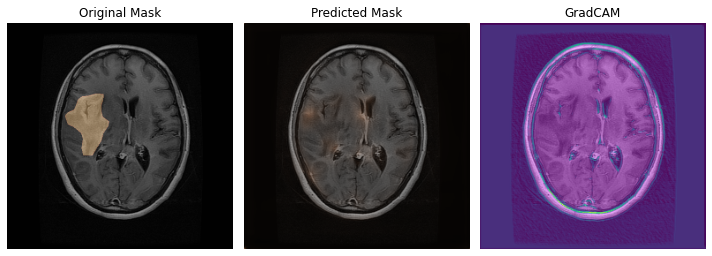

Epoch 4/50
274/274 [==============================] - 69s 251ms/step - loss: 0.0946 - accuracy: 0.0079 - IoU: 0.4916 - val_loss: 0.1127 - val_accuracy: 0.0081 - val_IoU: 0.4935


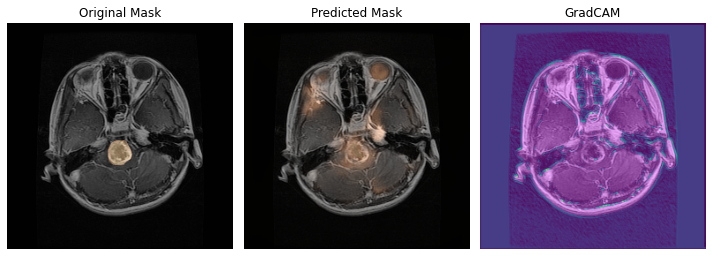

Epoch 5/50
274/274 [==============================] - 68s 249ms/step - loss: 0.0912 - accuracy: 0.0088 - IoU: 0.4917 - val_loss: 0.1038 - val_accuracy: 0.0067 - val_IoU: 0.4935


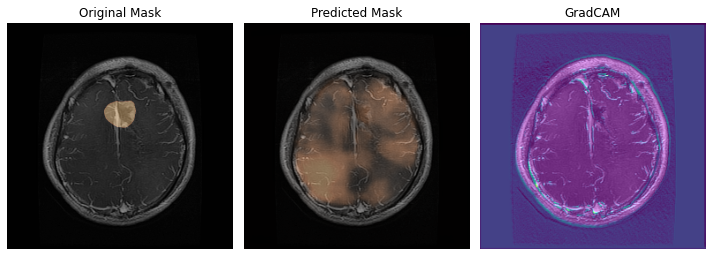

Epoch 6/50
274/274 [==============================] - 68s 250ms/step - loss: 0.0877 - accuracy: 0.0101 - IoU: 0.4917 - val_loss: 0.0916 - val_accuracy: 0.0077 - val_IoU: 0.4935


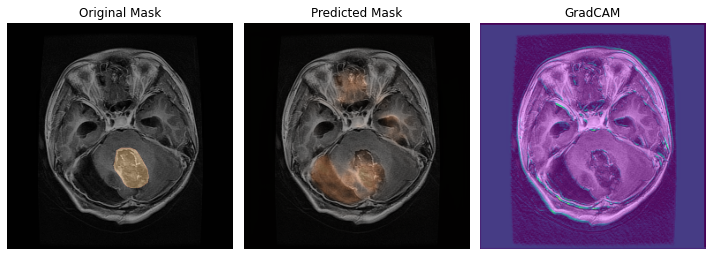

Epoch 7/50
274/274 [==============================] - 69s 250ms/step - loss: 0.0856 - accuracy: 0.0108 - IoU: 0.4918 - val_loss: 0.0902 - val_accuracy: 0.0062 - val_IoU: 0.4935


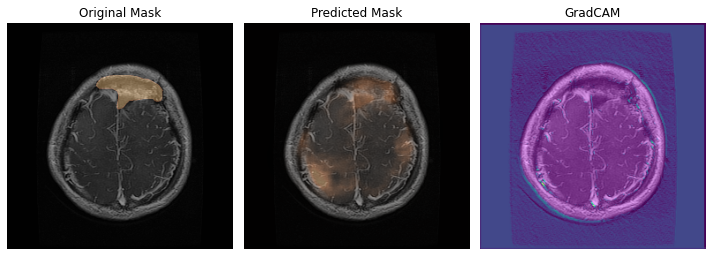

Epoch 8/50
274/274 [==============================] - 68s 250ms/step - loss: 0.0838 - accuracy: 0.0113 - IoU: 0.4926 - val_loss: 0.0861 - val_accuracy: 0.0088 - val_IoU: 0.4935


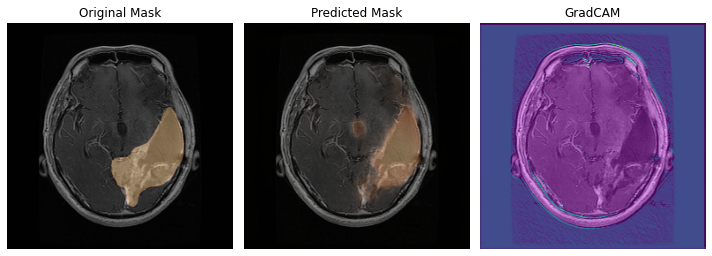

Epoch 9/50
274/274 [==============================] - 68s 248ms/step - loss: 0.0809 - accuracy: 0.0123 - IoU: 0.4941 - val_loss: 0.0876 - val_accuracy: 0.0075 - val_IoU: 0.4935


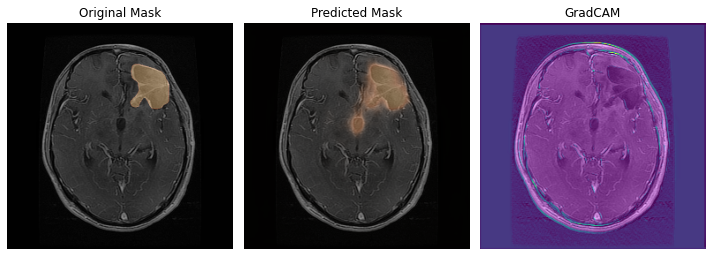

Epoch 10/50
274/274 [==============================] - 68s 250ms/step - loss: 0.0800 - accuracy: 0.0125 - IoU: 0.4944 - val_loss: 0.0865 - val_accuracy: 0.0085 - val_IoU: 0.4936


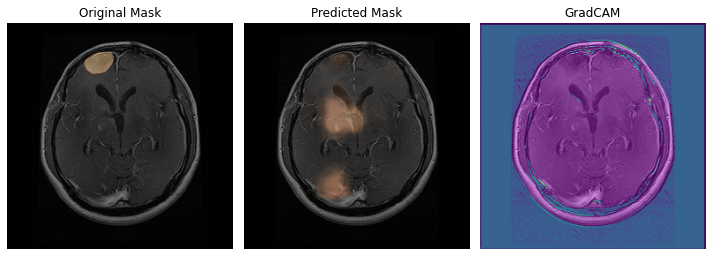

Epoch 11/50
274/274 [==============================] - 68s 249ms/step - loss: 0.0799 - accuracy: 0.0124 - IoU: 0.4937 - val_loss: 0.0820 - val_accuracy: 0.0084 - val_IoU: 0.4945


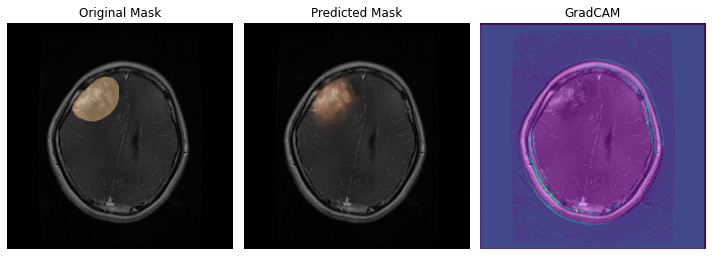

Epoch 12/50
274/274 [==============================] - 68s 249ms/step - loss: 0.0785 - accuracy: 0.0132 - IoU: 0.4955 - val_loss: 0.0930 - val_accuracy: 0.0075 - val_IoU: 0.4935


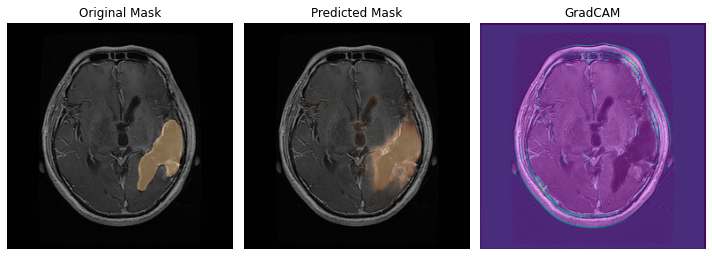

Epoch 13/50
274/274 [==============================] - 68s 248ms/step - loss: 0.0783 - accuracy: 0.0128 - IoU: 0.4947 - val_loss: 0.0832 - val_accuracy: 0.0081 - val_IoU: 0.4935


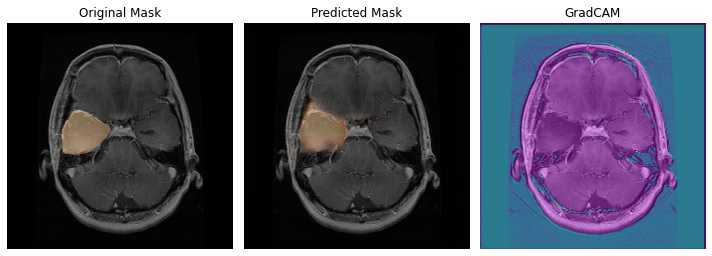

Epoch 14/50
274/274 [==============================] - 68s 248ms/step - loss: 0.0759 - accuracy: 0.0137 - IoU: 0.4971 - val_loss: 0.0830 - val_accuracy: 0.0082 - val_IoU: 0.4940


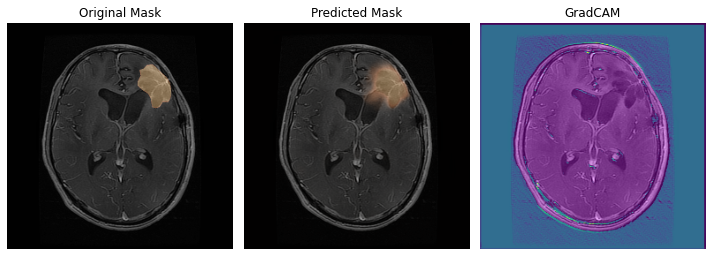

Epoch 15/50
274/274 [==============================] - 68s 248ms/step - loss: 0.0748 - accuracy: 0.0140 - IoU: 0.4989 - val_loss: 0.0830 - val_accuracy: 0.0094 - val_IoU: 0.4935


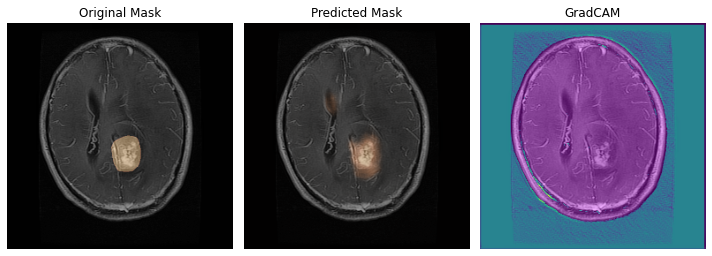

Epoch 16/50
274/274 [==============================] - 68s 248ms/step - loss: 0.0754 - accuracy: 0.0139 - IoU: 0.4986 - val_loss: 0.0816 - val_accuracy: 0.0092 - val_IoU: 0.4955


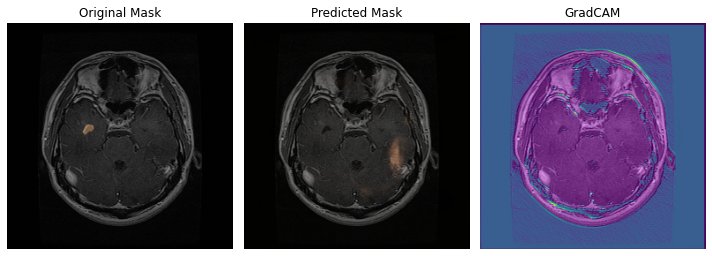

Epoch 17/50
274/274 [==============================] - 67s 246ms/step - loss: 0.0745 - accuracy: 0.0140 - IoU: 0.4998 - val_loss: 0.0795 - val_accuracy: 0.0098 - val_IoU: 0.4939


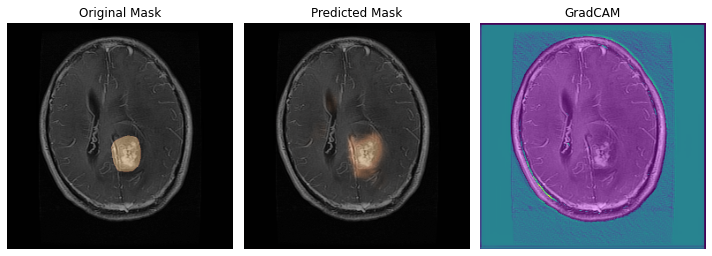

Epoch 18/50
274/274 [==============================] - 68s 247ms/step - loss: 0.0744 - accuracy: 0.0141 - IoU: 0.4979 - val_loss: 0.0807 - val_accuracy: 0.0094 - val_IoU: 0.5169


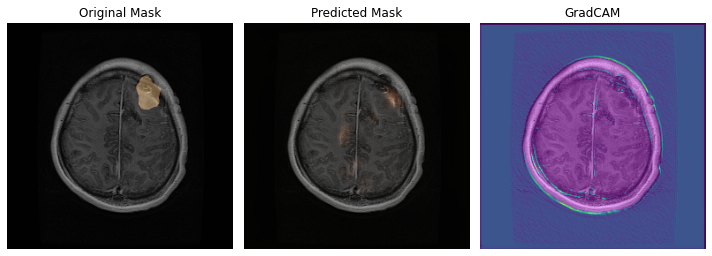

Epoch 19/50
274/274 [==============================] - 68s 247ms/step - loss: 0.0737 - accuracy: 0.0145 - IoU: 0.5021 - val_loss: 0.0859 - val_accuracy: 0.0099 - val_IoU: 0.4966


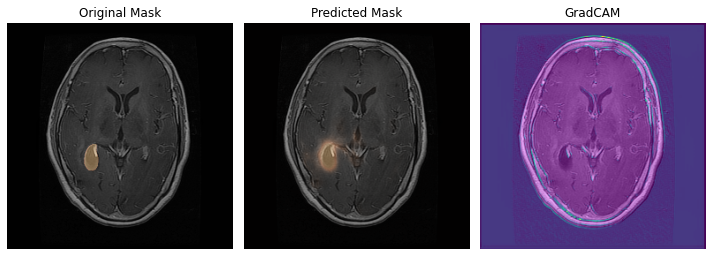

Epoch 20/50
274/274 [==============================] - 68s 247ms/step - loss: 0.0729 - accuracy: 0.0142 - IoU: 0.5028 - val_loss: 0.0822 - val_accuracy: 0.0098 - val_IoU: 0.4962


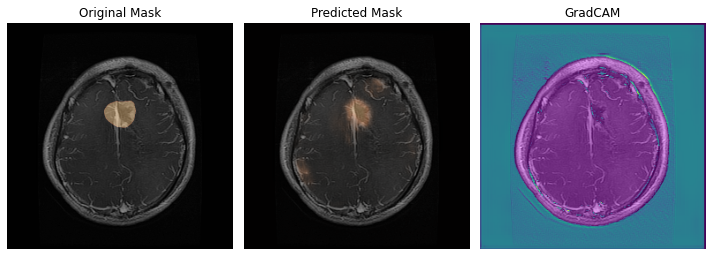

Epoch 21/50
274/274 [==============================] - 67s 246ms/step - loss: 0.0734 - accuracy: 0.0143 - IoU: 0.5023 - val_loss: 0.0808 - val_accuracy: 0.0090 - val_IoU: 0.4970


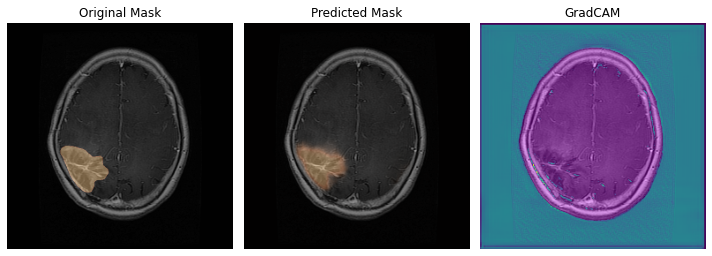

Epoch 22/50
274/274 [==============================] - 68s 247ms/step - loss: 0.0728 - accuracy: 0.0148 - IoU: 0.5069 - val_loss: 0.0798 - val_accuracy: 0.0088 - val_IoU: 0.4949


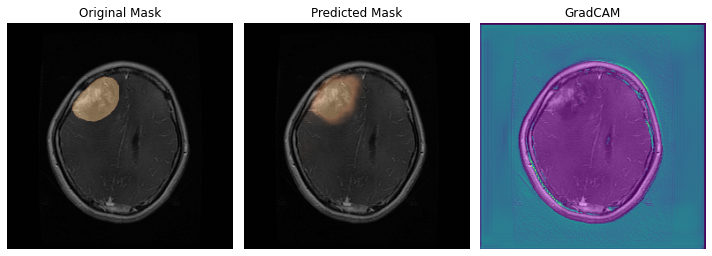

Epoch 23/50
274/274 [==============================] - 68s 247ms/step - loss: 0.0728 - accuracy: 0.0144 - IoU: 0.5054 - val_loss: 0.0829 - val_accuracy: 0.0079 - val_IoU: 0.4941


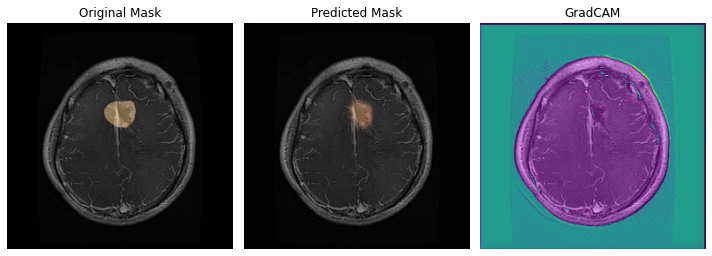

Epoch 24/50
274/274 [==============================] - 67s 246ms/step - loss: 0.0739 - accuracy: 0.0144 - IoU: 0.4991 - val_loss: 0.0815 - val_accuracy: 0.0092 - val_IoU: 0.4976


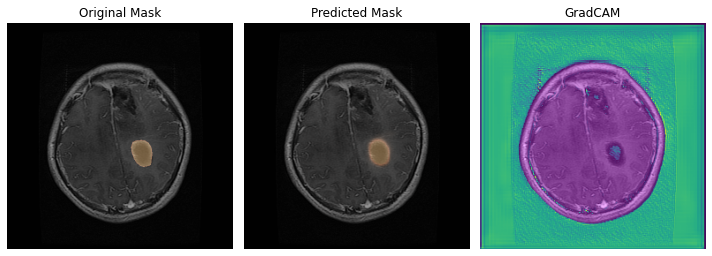

Epoch 25/50
274/274 [==============================] - 67s 246ms/step - loss: 0.0713 - accuracy: 0.0148 - IoU: 0.5119 - val_loss: 0.0808 - val_accuracy: 0.0099 - val_IoU: 0.5226


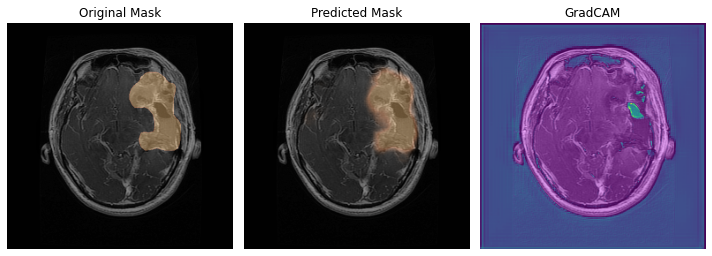

Epoch 26/50
274/274 [==============================] - 67s 246ms/step - loss: 0.0717 - accuracy: 0.0149 - IoU: 0.5138 - val_loss: 0.0807 - val_accuracy: 0.0092 - val_IoU: 0.5046


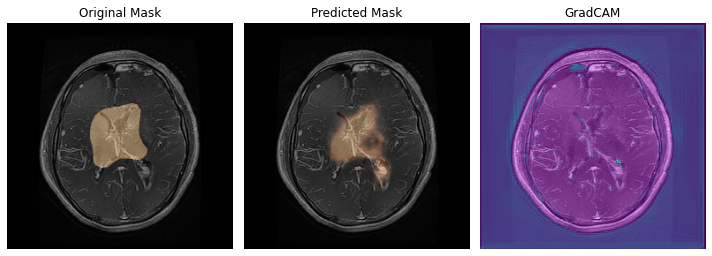

Epoch 27/50
274/274 [==============================] - 67s 245ms/step - loss: 0.0732 - accuracy: 0.0145 - IoU: 0.5044 - val_loss: 0.0813 - val_accuracy: 0.0089 - val_IoU: 0.4960


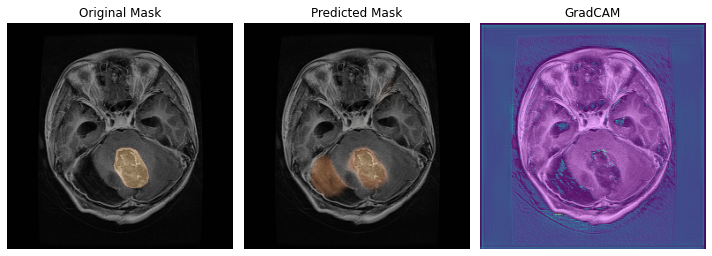

Epoch 28/50
274/274 [==============================] - 67s 246ms/step - loss: 0.0720 - accuracy: 0.0146 - IoU: 0.5044 - val_loss: 0.0807 - val_accuracy: 0.0092 - val_IoU: 0.5003


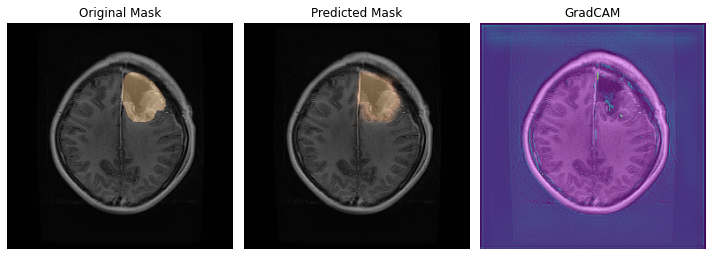

Epoch 29/50
274/274 [==============================] - 67s 245ms/step - loss: 0.0714 - accuracy: 0.0150 - IoU: 0.5064 - val_loss: 0.0802 - val_accuracy: 0.0091 - val_IoU: 0.4954


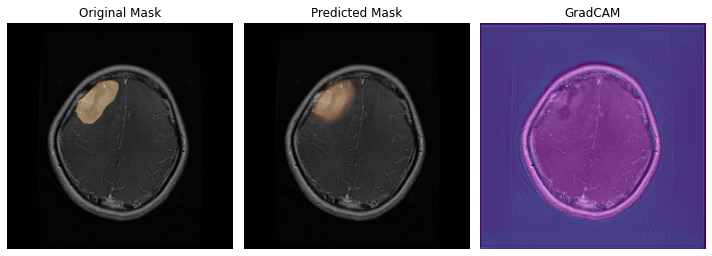

Epoch 30/50
274/274 [==============================] - 67s 246ms/step - loss: 0.0705 - accuracy: 0.0149 - IoU: 0.5116 - val_loss: 0.0814 - val_accuracy: 0.0100 - val_IoU: 0.5001


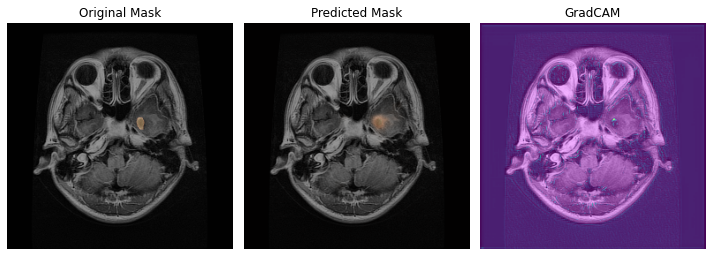

Epoch 31/50
274/274 [==============================] - 67s 246ms/step - loss: 0.0707 - accuracy: 0.0152 - IoU: 0.5078 - val_loss: 0.0805 - val_accuracy: 0.0094 - val_IoU: 0.5029


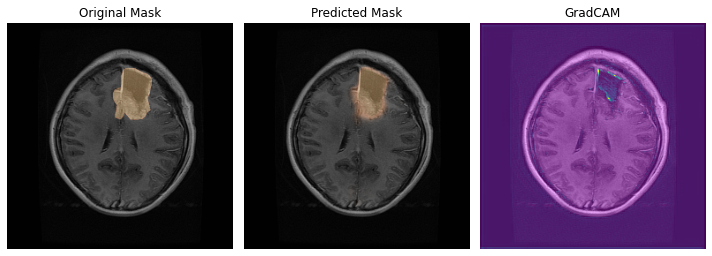

Epoch 32/50
274/274 [==============================] - 67s 246ms/step - loss: 0.0713 - accuracy: 0.0149 - IoU: 0.5065 - val_loss: 0.0797 - val_accuracy: 0.0092 - val_IoU: 0.5030


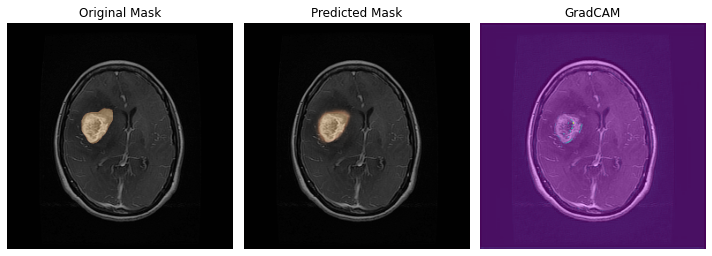

Epoch 33/50
274/274 [==============================] - 67s 245ms/step - loss: 0.0703 - accuracy: 0.0154 - IoU: 0.5138 - val_loss: 0.0801 - val_accuracy: 0.0089 - val_IoU: 0.5015


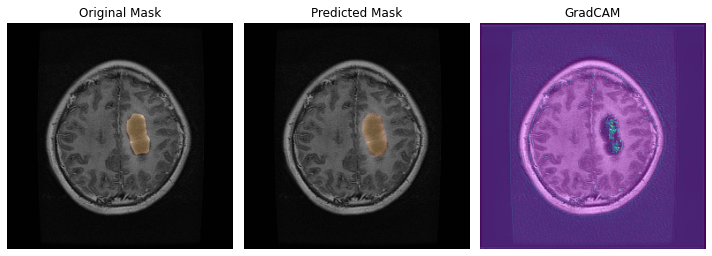

Epoch 34/50
274/274 [==============================] - 67s 245ms/step - loss: 0.0722 - accuracy: 0.0149 - IoU: 0.5056 - val_loss: 0.0812 - val_accuracy: 0.0097 - val_IoU: 0.5043


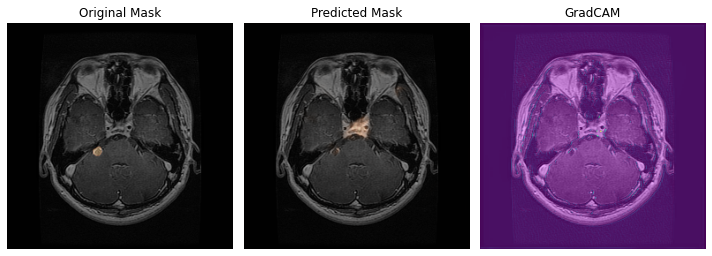

Epoch 35/50
274/274 [==============================] - 67s 245ms/step - loss: 0.0713 - accuracy: 0.0148 - IoU: 0.5141 - val_loss: 0.0813 - val_accuracy: 0.0093 - val_IoU: 0.5113


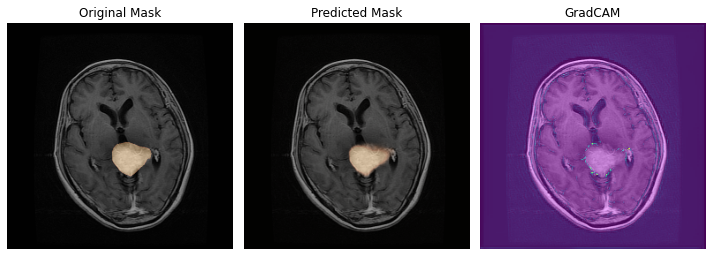

Epoch 36/50
274/274 [==============================] - 67s 246ms/step - loss: 0.0707 - accuracy: 0.0150 - IoU: 0.5142 - val_loss: 0.0796 - val_accuracy: 0.0095 - val_IoU: 0.5031


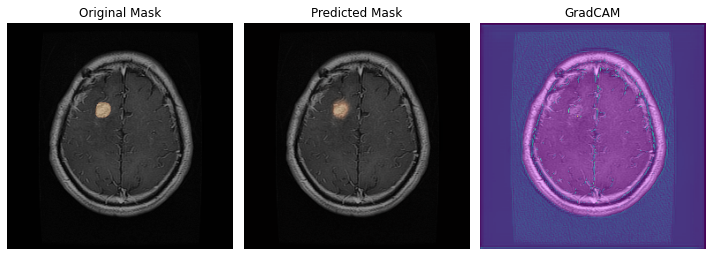

Epoch 37/50
274/274 [==============================] - 67s 245ms/step - loss: 0.0709 - accuracy: 0.0150 - IoU: 0.5129 - val_loss: 0.0801 - val_accuracy: 0.0093 - val_IoU: 0.5126


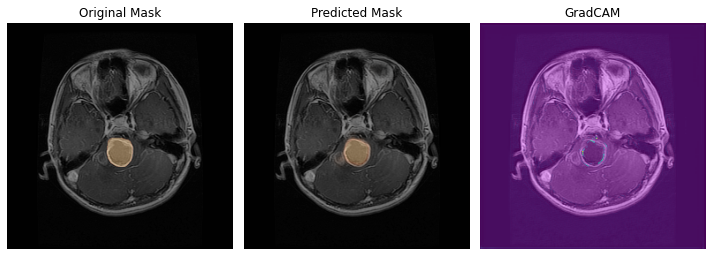

Epoch 38/50
274/274 [==============================] - 67s 245ms/step - loss: 0.0697 - accuracy: 0.0153 - IoU: 0.5217 - val_loss: 0.0802 - val_accuracy: 0.0093 - val_IoU: 0.5023


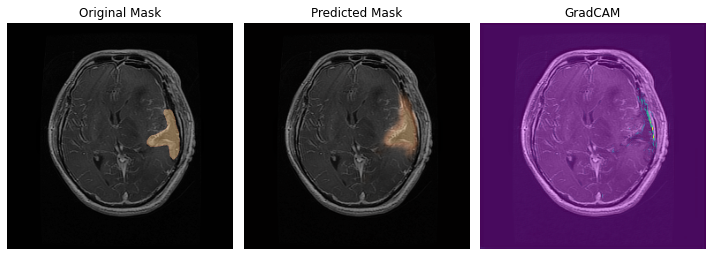

Epoch 39/50
274/274 [==============================] - 67s 245ms/step - loss: 0.0701 - accuracy: 0.0154 - IoU: 0.5142 - val_loss: 0.0799 - val_accuracy: 0.0094 - val_IoU: 0.5063


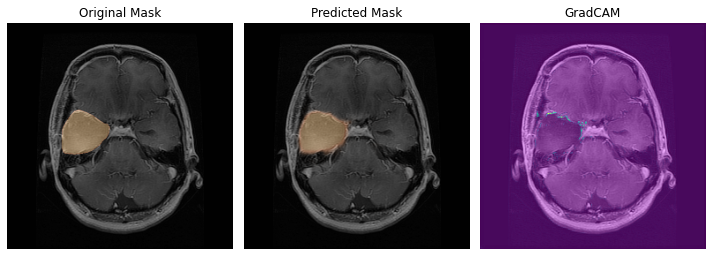

Epoch 40/50
274/274 [==============================] - 67s 245ms/step - loss: 0.0717 - accuracy: 0.0147 - IoU: 0.5114 - val_loss: 0.0813 - val_accuracy: 0.0096 - val_IoU: 0.5243


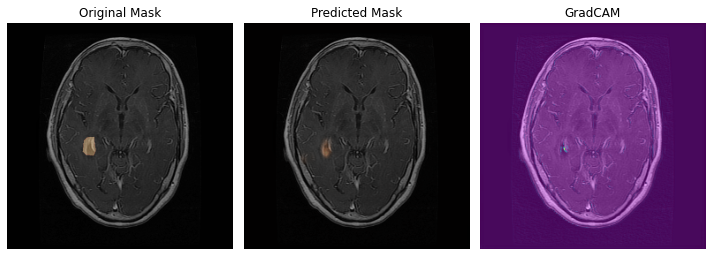

Epoch 41/50
274/274 [==============================] - 13s 46ms/step - loss: 0.0715 - accuracy: 0.0152 - IoU: 0.5024 - val_loss: 0.0803 - val_accuracy: 0.0085 - val_IoU: 0.4973


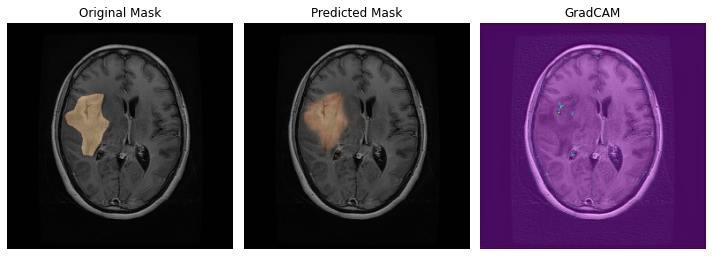

In [37]:
# Config Training
BATCH_SIZE = 8
SPE = len(images)//BATCH_SIZE

# Training
results = model.fit(
    images, masks,
    validation_split=0.2,
    epochs=50, # 15 will be enough for a good Model for better model go with 20+
    steps_per_epoch=SPE,
    batch_size=BATCH_SIZE,
    callbacks=cb
)

**Observations :**

* After **12 epochs** model started outputting what we needed.
* The model was easily able to detect **black round spots but fails when the shape is irregular**(Not the case with current model because it is trained with hight SPE). 

* It also gets confused between the dark areas, which makes sense.

---
**Suggestion :**
* Do training in chunks of **20 Epochs**, this will give you a good control **over model and the model will also perform well**.

* Here the model is trained on 17 + 17 + 17 = 51 Epochs.

* If you give the model a closer look n different images you will find that the model fails at some images, but I can garantee that 9/10 such images would be so tough that even a human will not be a able to detect as many parts of the image look the same.


# **Evaluation**

In [39]:
loss, accuracy, iou, val_loss, val_accuracy, val_iou = results.history.values()

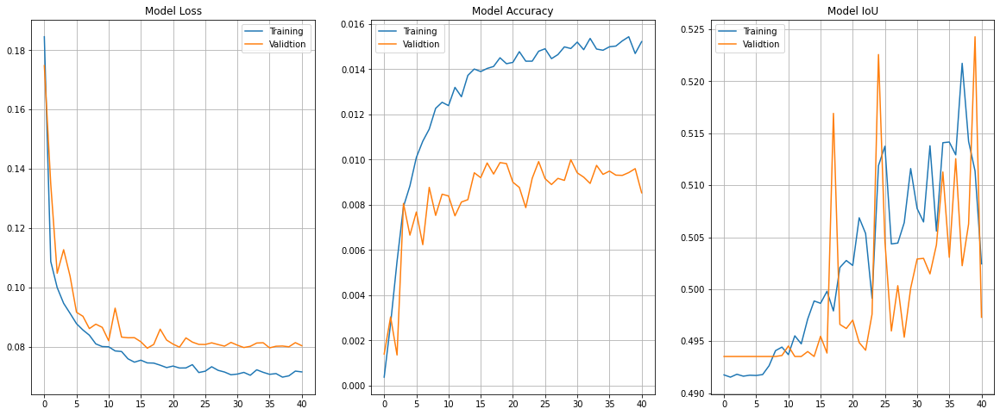

In [40]:
plt.figure(figsize=(20,8))

plt.subplot(1,3,1)
plt.title("Model Loss")
plt.plot(loss, label="Training")
plt.plot(val_loss, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,2)
plt.title("Model Accuracy")
plt.plot(accuracy, label="Training")
plt.plot(val_accuracy, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,3)
plt.title("Model IoU")
plt.plot(iou, label="Training")
plt.plot(val_iou, label="Validtion")
plt.legend()
plt.grid()

plt.show()

Suprisingly the results on **Validation Data** are **way better** than the results on **Trainind Data** on **IoU**, this may indicate that the **model can perform way better** than what it can do at the current point. The **Loss is not Perfect** it increases in the last but the model constructions are loooking perfect as this point, that's why **I believe in what I see**. This model seems promising, let's try it on some Images.

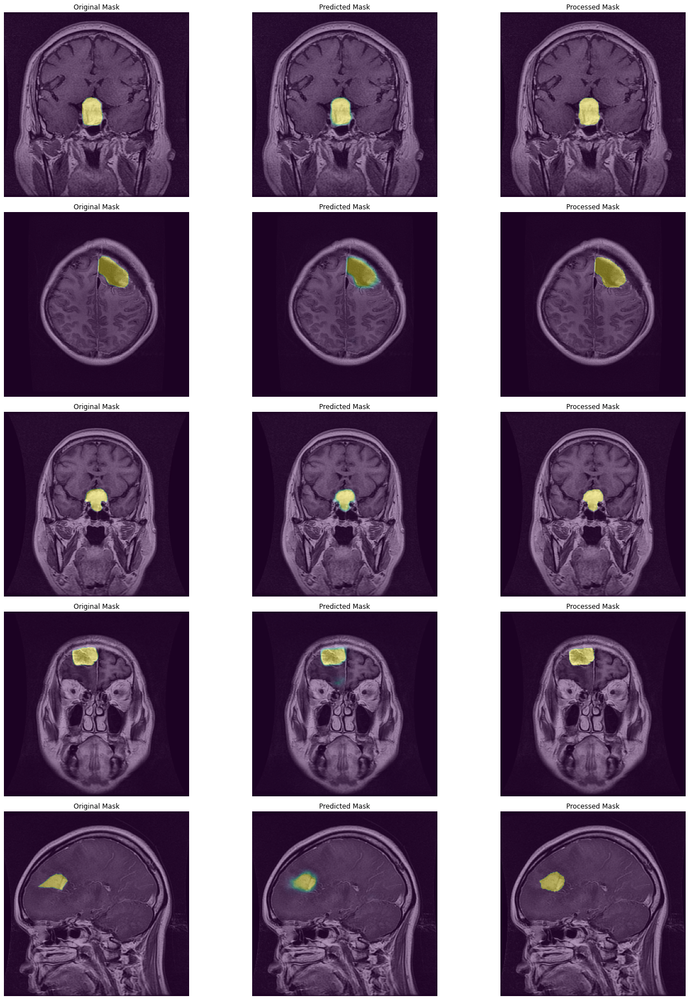

In [41]:
plt.figure(figsize=(20,25))
n=0
for i in range(1,(5*3)+1):
    plt.subplot(5,3,i)
    if n==0:
        id = np.random.randint(len(images))
        image = images[id]
        mask = masks[id]
        pred_mask = model.predict(image[np.newaxis,...])

        plt.title("Original Mask")
        show_mask(image, mask)
        n+=1
    elif n==1:
        plt.title("Predicted Mask")
        show_mask(image, pred_mask)
        n+=1
    elif n==2:
        pred_mask = (pred_mask>0.5).astype('float')
        plt.title("Processed Mask")
        show_mask(image, pred_mask)
        n=0
plt.tight_layout()
plt.show()

In [ ]:
#CNN
class CNNShowProgress(Callback):
    def on_epoch_end(self, epochs, logs=None):
        id = np.random.randint(200)
        image = images[id]
        mask = masks[id]
        pred_mask = self.model.predict(image[np.newaxis,...])
        cam = np.zeros_like(image[..., 0])  # 初始化默认值
        
        try:
            valid_layers = [
                "block3_attention",   # 最后一个注意力层
                "final_conv",        # 上采样后的卷积层
                "block3_conv"        # 深层特征层
            ]
            
            # 获取模型所有层名
            layer_names = [layer.name for layer in self.model.layers]
            
            # 寻找第一个可用的有效层
            for layer_name in valid_layers:
                if layer_name in layer_names:
                    exp = GradCAM()
                    cam = exp.explain(
                        validation_data=(image[np.newaxis,...], mask),
                        class_index=1,
                        layer_name=layer_name,
                        model=self.model
                    )
                    break
                    
        except Exception as e:
            print(f"GradCAM失败: {str(e)}")

        # 可视化部分保持不变
        plt.figure(figsize=(10,5))
        plt.subplot(1,3,1)
        plt.title("Original Mask")
        show_mask(image, mask, cmap='copper')

        plt.subplot(1,3,2)
        plt.title("Predicted Mask")
        show_mask(image, pred_mask, cmap='copper')

        plt.subplot(1,3,3)
        show_image(cam, title="GradCAM")
        
        plt.tight_layout()
        plt.show()


# Common & Data 部分与原始代码保持一致
import os
import keras
import numpy as np
import pandas as pd
from glob import glob
import tensorflow as tf
import tensorflow.image as tfi
from keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt


# ---- 修正后的通道注意力模块 ----
class ChannelAttention(Layer):
    """动态调整通道数的注意力模块"""
    def __init__(self, ratio=8, **kwargs):
        super(ChannelAttention, self).__init__(**kwargs)
        self.ratio = ratio
        self.gap = GlobalAveragePooling2D(keepdims=True)  # 保持维度
        self.flatten = Flatten()
        
    def build(self, input_shape):
        self.channels = input_shape[-1]
        self.dense1 = Dense(self.channels//self.ratio, activation='relu')
        self.dense2 = Dense(self.channels, activation='sigmoid')
        super().build(input_shape)
        
    def call(self, inputs):
        x = self.gap(inputs)
        x = self.flatten(x)
        x = self.dense1(x)
        x = self.dense2(x)
        return Multiply()([inputs, x[:, tf.newaxis, tf.newaxis, :]])
    # 关键修正：添加序列化方法
    def get_config(self):
        config = super().get_config()
        config.update({
            "ratio": self.ratio
        })
        return config

def build_cnn_with_attention(input_shape):
    inputs = Input(shape=input_shape)
    
    # Block 1
    x = Conv2D(64, 3, padding='same', activation='relu', name='block1_conv')(inputs)
    x = ChannelAttention(ratio=8, name='block1_attention')(x)
    x = MaxPool2D(2, name='block1_pool')(x)
    
    # Block 2
    x = Conv2D(128, 3, padding='same', activation='relu', name='block2_conv')(x)
    x = ChannelAttention(ratio=8, name='block2_attention')(x)
    x = MaxPool2D(2, name='block2_pool')(x)
    
    # Block 3
    x = Conv2D(256, 3, padding='same', activation='relu', name='block3_conv')(x)
    x = ChannelAttention(ratio=8, name='block3_attention')(x)
    x = MaxPool2D(2, name='block3_pool')(x)
    
    # 上采样
    x = UpSampling2D(8, name='final_upsample')(x)
    x = Conv2D(64, 3, padding='same', activation='relu', name='final_conv')(x)
    
    outputs = Conv2D(1, 1, activation='sigmoid', name='output')(x)
    
    return Model(inputs, outputs)


# ---- 模型初始化与编译 ----
SIZE = 256  # 与原始代码保持一致
model_cnn = build_cnn_with_attention((SIZE, SIZE, 3))
model_cnn.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy', MeanIoU(num_classes=2)]
)

# ---- 训练配置（保持与原实验一致）----
cb = [
    ModelCheckpoint("CNN_Attention.h5", save_best_only=True),
    CNNShowProgress()  # 沿用原可视化回调
]

# 训练执行（数据加载与之前完全相同）
results_cnn = model_cnn.fit(
    images, masks,
    validation_split=0.2,
    epochs=10,
    steps_per_epoch=SPE,
    batch_size=BATCH_SIZE,
    callbacks=cb
)

In [ ]:
loss, accuracy, iou, val_loss, val_accuracy, val_iou = results_cnn.history.values()

In [ ]:
plt.figure(figsize=(20,8))

plt.subplot(1,3,1)
plt.title("CNNModel Loss")
plt.plot(loss, label="Training")
plt.plot(val_loss, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,2)
plt.title("CNNModel Accuracy")
plt.plot(accuracy, label="Training")
plt.plot(val_accuracy, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,3)
plt.title("CNNModel IoU")
plt.plot(iou, label="Training")
plt.plot(val_iou, label="Validtion")
plt.legend()
plt.grid()

plt.show()

In [ ]:
# ---- 对比可视化（新增）----
def compare_architectures(original_model, cnn_model, num_samples=3):
    plt.figure(figsize=(20, 15))
    for i in range(num_samples):
        idx = np.random.randint(len(images))
        
        # 原UNet预测
        plt.subplot(num_samples, 3, i*3+1)
        plt.title('Ground Truth')
        show_mask(images[idx], masks[idx], cmap='copper')
        
        # CNN预测
        plt.subplot(num_samples, 3, i*3+2)
        pred_cnn = cnn_model.predict(images[idx][np.newaxis,...])
        plt.title('CNN+Attention')
        show_mask(images[idx], pred_cnn, cmap='copper')
        
        # 原UNet预测
        plt.subplot(num_samples, 3, i*3+3)
        pred_unet = original_model.predict(images[idx][np.newaxis,...])
        plt.title('Original UNet')
        show_mask(images[idx], pred_unet, cmap='copper')
        
    plt.tight_layout()
    plt.show()

# 执行对比
compare_architectures(model, model_cnn)

The results totally convincing. If you have any suggestions please let me know 👍. **Thanks !!**

In [ ]:
plt.figure(figsize=(20,25))
n=0
for i in range(1,(5*3)+1):
    plt.subplot(5,3,i)
    if n==0:
        id = np.random.randint(len(images))
        image = images[id]
        mask = masks[id]
        pred_mask = model_cnn.predict(image[np.newaxis,...])

        plt.title("Original Mask")
        show_mask(image, mask)
        n+=1
    elif n==1:
        plt.title("Predicted Mask")
        show_mask(image, pred_mask)
        n+=1
    elif n==2:
        pred_mask = (pred_mask>0.5).astype('float')
        plt.title("Processed Mask")
        show_mask(image, pred_mask)
        n=0
plt.tight_layout()
plt.show()